In [1]:
import torch
# torch.autograd.set_detect_anomaly(True)
from torch.utils.data import DataLoader,WeightedRandomSampler
from torch.optim.lr_scheduler import PolynomialLR
import torch.nn.functional as F
from torchvision.transforms import v2

import albumentations as A
from albumentations.pytorch import ToTensorV2
import segmentation_models_pytorch as smp

from tqdm.notebook import tqdm
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import os
###IE###
%load_ext autoreload
%autoreload 2
from utils.helpers import (
    plot_some_images ,read_images ,
    pre_hard_skeletonize , pre_soft_skeletonize,
    compute_confution_matrix,draw_mask,TP_TN_FP_FN,)
from utils.preprocessing import (
    WhiteTopHat , CLAHE , normalize_xca,
    BrightnessMultiplicativeNNUNet2D,
    ContrastAugmentationNNUNet2D)
from utils.dataset import  (
    TrainUnetDataset  
)
from models.nnunet import nnUnet
from models.memory_unet import MemoryUnet
from utils.losses import UnetLoss
from utils.recorder import HistoryRecorder
from logger import save_full_report
from trainer import trainer
###SS###
from trainer import evaluation

In [ ]:
args = {
    "base_path" : "./dataset/syntax/",
    "memory_unet":{
        "layer_count":4,
        "channel_max":256,
        "downsampling":"maxpool",
        "normaliztion":"InstanceNorm2d",
        "activation" : "LeakyReLU",
        "first_layer_out_c" : 64
    },
    "image_shape" : (448,448),
    "in_c":1,
    
    "training_mode":"binary",
    "report_class_wise":True,
    "attention" : False,
    "batch_size" : 8,
    "num_workers" : 5,
    "device" : "cuda" if torch.cuda.is_available() else "cpu",
    "epcohs":10,
    "f_int_scale" : 2,
    "full_report_cycle" : 1,
    "max_channels":512,
    "loss_type":"tversky",
    "output_base_path" : "./outputs",
    "name" : "binary-tests-tversky",
    "deep_super_vision" : False,
    "mask_ce_weights":None,
    "layer_count":5,
    ### Loss Functions
    "mask_ce_conf":{
        "imp_coef":1.0
    },
    "focal_ce_conf":{
        "gamma":2.0,
        "loss_scale":1.0,
        "imp_coef":1.0
    },
    "tversky_conf":{
        "alpha":0.5,
        "beta":0.5,
        "gamma":2.00,
        "weights":None,
        "imp_coef":1.0
    },
    "cl_dice_conf":{
        "imp_coef":1.0,
        "k":40
    },
    ### Optimizers
    "sgd_conf":{
        "lr" : 0.1,
        "momentum" : 0.99,
        "weight_decay" : 3e-5,
        "nesterov":True
    },
    "adam_conf":{
        "lr" : 0.01,
        "weight_decay" : 3e-5,
    }
}
if(args["training_mode"] == "binary"):
    args["class_count"] = 2 
    class_map = {
        1:"fg"
    }

else:
    args["class_count"] = 26
    class_map = {
        1: '1',2: '2', 3: '3',4: '4',
        5: '5',6: '6',7:'9',8:'7',9:'9a',
        10:'10',11:'8',12:'10a',13:'12',14:'11',
        15:'12a',16:'12b',17:'13',18:'14',19:'14a',
        20:'14b',21:'15',22:'16',
        23: '16a',24: '16b',25: '16c',
    }

# losses_keys = ["total loss","FCE loss",args["loss_type"]]
losses_keys = ["total loss","mask CE-Loss",args["loss_type"],"cl dice loss"]
out_counts = args["layer_count"] if args["deep_super_vision"] else 1
loss_weights = [1/(2**i) for i in range(out_counts)]
loss_weights



[1.0]

In [3]:
if(args["training_mode"]!="binary"):
    b=0.999

    train_class_counts = [
        1200,374,375,369,303,525,537,
        198,340,70,21,310,1,61,320,129,
        63,305,107,49,127,38,232,43,48,31
    ]

    total = np.sum(train_class_counts)
    mask_ce_weights = np.log(total/np.array(train_class_counts))
    mask_ce_weights = (mask_ce_weights / mask_ce_weights.mean()).tolist()
    mask_ce_weights[0]=0.1

    args["mask_ce_weights"]=mask_ce_weights
    args["mask_ce_weights"]
else:
    args["mask_ce_weights"]=[0.1,1]

In [4]:
# args["t_alpha"] = [1,0.8]
args["tversky_conf"]["t_alpha"] = None

In [5]:
train_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    A.Downscale(
        scale_range=[0.7, 1],
        interpolation_pair={"downscale": 0, "upscale": 0},
        p=0.5
    ),
    A.GaussNoise(
        std_range=[0.0, 0.1],
        mean_range=[0, 0],
        per_channel=True,
        noise_scale_factor=1,
        p=0.5
    ),
    A.GaussianBlur(
        sigma_limit=[1.0,1.5],
        blur_limit = (3,7),
        p=0.5
    ),

    A.OneOf([
        A.ElasticTransform(
            alpha=120, 
            sigma=120 * 0.05, 
            p=1.0
        ),
        A.GridDistortion(num_steps=5, distort_limit=0.3, p=1.0),
        A.OpticalDistortion(distort_limit=0.2, p=1.0),
    ], p=0.5),
    A.Compose([
        A.InvertImg(p=1.0),
        A.RandomGamma(gamma_limit=(70, 150), p=1.0),
        A.InvertImg(p=1.0),
    ], p=0.5),
    BrightnessMultiplicativeNNUNet2D(multiplier_range=(0.70, 1.3), p=0.5),
    ContrastAugmentationNNUNet2D(contrast_range=(0.65, 1.5), p=0.5),
    A.RandomGamma(
        gamma_limit=(90, 120), 
        p=0.5
    ),
    A.Affine(
        scale=(0.7, 1.4),  
        translate_percent=(0, 0),
        rotate=0,               
        shear=0,                 
        fit_output=False, 
        p=0.5
    ),
    A.Rotate(limit=30, p=0.5, fill_mask = 0),
    A.Rotate(limit=-30, p=0.5, fill_mask = 0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),

    ]
)
test_transforms = A.Compose([
    A.Resize(*args["image_shape"]),
    ]  
)

if(args["in_c"]==1):
    normalizer = normalize_xca
else:
    normalizer = A.Normalize(
        mean=(0.485, 0.456, 0.406),
        std=(0.229, 0.224, 0.225),
        max_pixel_value=255.0,
    )
train_preprocess = None


/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:54: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/home/parsa/Masters/Coronary Artry/Datasets/Arcade/codes/utils/preprocessing.py:67: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


In [6]:
train_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "train",chosen_labels=[19,25])
valid_images = read_images(base_path = args["base_path"],preprocessor = train_preprocess,part = "val",chosen_labels=[19,25])


NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/1000 [00:00<?, ?it/s]

NOTE : preprocessor is not defined . no preprocessing will be used !


  0%|          | 0/200 [00:00<?, ?it/s]

In [7]:

train_ds = TrainUnetDataset(
    transform = train_transforms,
    data = train_images , 
    normalizer = normalizer,
    example_phase=False
)
valid_ds = TrainUnetDataset(
    transform = test_transforms,
    data = valid_images,
    normalizer = normalizer,
    example_phase=False
)
# sampler = WeightedRandomSampler(
#     weights=sampler_weights, 
#     num_samples=len(sampler_weights),
#     replacement=True)

train_loader = DataLoader(
    train_ds,
    batch_size = args["batch_size"] ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=True
    # sampler=sampler
)
valid_loader = DataLoader(
    valid_ds,
    batch_size = args["batch_size"]  ,
    num_workers = args["num_workers"] ,
    pin_memory=True,
    shuffle=False
)


In [8]:

# model = nnUnet(args).to(args["device"])
model = MemoryUnet(args).to(args["device"])

loss_fn = UnetLoss(args)
# optimizer = torch.optim.Adam(
#     model.parameters(), 
#     **args["adam_conf"]
# )
optimizer = torch.optim.SGD(
    model.parameters(),
    **args["sgd_conf"]
)
# optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2)
# lr_sch = PolynomialLR(optimizer=optimizer,total_iters=args["epcohs"],power=0.9)
lr_sch = None
recorder = HistoryRecorder(losses_keys=losses_keys,class_maps =class_map,class_count=args["class_count"]-1)


best_model = trainer(
    args=args,
    recorder = recorder,
    model = model,
    optimizer = optimizer,
    loss_fn = loss_fn,
    train_loader = train_loader,
    valid_loader = valid_loader,
    loss_weights=loss_weights,
    lr_sch = lr_sch
)
# best_model = model


encoder info : 
[1, 64, 128, 256, 256]
-----------------------
loss is set to tversky


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (0)
total loss : 1.0550130343437194 - mask CE-Loss : 0.3547926740646362 - tversky : 0.1747019273340702
cl dice loss : 0.5255184354782104 - 
train avg metrics for epoch 0 :
avg dice : 0.3821496069431305 - avg precision : 0.2552996277809143 - avg recall : 0.7595400214195251
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (0)
total loss : 0.7393619084358215 - mask CE-Loss : 0.25848599910736086 - tversky : 0.0943562014400959
cl dice loss : 0.3865197134017944 - 
valid avg metrics for epoch 0 :
avg dice : 0.5404053926467896 - avg precision : 0.40340638160705566 - avg recall : 0.8183068037033081
fg => dice : 0.5404053926467896 p : 0.40340638160705566 , r : 0.8183068037033081
------------------------------------------------------------
New Best! : dice = 0.5404053926467896


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (1)
total loss : 0.7179302859306336 - mask CE-Loss : 0.24807098639011382 - tversky : 0.08891355913877487
cl dice loss : 0.38094574069976805 - 
train avg metrics for epoch 1 :
avg dice : 0.5363813042640686 - avg precision : 0.3953951299190521 - avg recall : 0.8336285948753357
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (1)
total loss : 0.654361503124237 - mask CE-Loss : 0.25091922879219053 - tversky : 0.06606051847338676
cl dice loss : 0.33738176107406614 - 
valid avg metrics for epoch 1 :
avg dice : 0.5449274778366089 - avg precision : 0.39826518297195435 - avg recall : 0.8625721335411072
fg => dice : 0.5449274778366089 p : 0.39826518297195435 , r : 0.8625721335411072
------------------------------------------------------------
New Best! : dice = 0.5449274778366089


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (2)
total loss : 0.6804267129898072 - mask CE-Loss : 0.2348087465763092 - tversky : 0.07996462351083755
cl dice loss : 0.3656533432006836 - 
train avg metrics for epoch 2 :
avg dice : 0.5457680225372314 - avg precision : 0.40298253297805786 - avg recall : 0.8452632427215576
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (2)
total loss : 0.6590909385681152 - mask CE-Loss : 0.2560166311264038 - tversky : 0.07070862606167794
cl dice loss : 0.33236568689346313 - 
valid avg metrics for epoch 2 :
avg dice : 0.5703890323638916 - avg precision : 0.43228042125701904 - avg recall : 0.8381767868995667
fg => dice : 0.5703890323638916 p : 0.43228042125701904 , r : 0.8381767868995667
------------------------------------------------------------
New Best! : dice = 0.5703890323638916


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (3)
total loss : 0.6618108294010162 - mask CE-Loss : 0.22787648403644561 - tversky : 0.07600062218308448
cl dice loss : 0.35793372631073 - 
train avg metrics for epoch 3 :
avg dice : 0.5589569211006165 - avg precision : 0.4173746705055237 - avg recall : 0.8459057807922363
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (3)
total loss : 0.6268561124801636 - mask CE-Loss : 0.23748643577098846 - tversky : 0.06011640712618828
cl dice loss : 0.32925326824188234 - 
valid avg metrics for epoch 3 :
avg dice : 0.5624005794525146 - avg precision : 0.4161858856678009 - avg recall : 0.866993248462677
fg => dice : 0.5624005794525146 p : 0.4161858856678009 , r : 0.866993248462677
------------------------------------------------------------


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (4)
total loss : 0.6271152226924896 - mask CE-Loss : 0.21390313935279845 - tversky : 0.0683076034784317
cl dice loss : 0.34490448141098023 - 
train avg metrics for epoch 4 :
avg dice : 0.571384072303772 - avg precision : 0.42885008454322815 - avg recall : 0.8558306694030762
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (4)
total loss : 0.5947796869277954 - mask CE-Loss : 0.21118756532669067 - tversky : 0.06375473499298095
cl dice loss : 0.3198373818397522 - 
valid avg metrics for epoch 4 :
avg dice : 0.5906478762626648 - avg precision : 0.44990241527557373 - avg recall : 0.8595438599586487
fg => dice : 0.5906478762626648 p : 0.44990241527557373 , r : 0.8595438599586487
------------------------------------------------------------
New Best! : dice = 0.5906478762626648


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (5)
total loss : 0.6137010595798492 - mask CE-Loss : 0.2071817765235901 - tversky : 0.06649517205357551
cl dice loss : 0.3400241117477417 - 
train avg metrics for epoch 5 :
avg dice : 0.5729506611824036 - avg precision : 0.42946481704711914 - avg recall : 0.8604202270507812
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (5)
total loss : 0.5766564977169036 - mask CE-Loss : 0.21296096920967103 - tversky : 0.054957458674907686
cl dice loss : 0.3087380695343018 - 
valid avg metrics for epoch 5 :
avg dice : 0.5924714207649231 - avg precision : 0.4493422210216522 - avg recall : 0.8694027066230774
fg => dice : 0.5924714207649231 p : 0.4493422210216522 , r : 0.8694027066230774
------------------------------------------------------------
New Best! : dice = 0.5924714207649231


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (6)
total loss : 0.5848914785385132 - mask CE-Loss : 0.19665057027339936 - tversky : 0.0611218149960041
cl dice loss : 0.32711909198760986 - 
train avg metrics for epoch 6 :
avg dice : 0.5896744132041931 - avg precision : 0.4473648965358734 - avg recall : 0.8647597432136536
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (6)
total loss : 0.544190320968628 - mask CE-Loss : 0.1912444779276848 - tversky : 0.052473906874656674
cl dice loss : 0.300471932888031 - 
valid avg metrics for epoch 6 :
avg dice : 0.6022400856018066 - avg precision : 0.4580840468406677 - avg recall : 0.8787893652915955
fg => dice : 0.6022400856018066 p : 0.4580840468406677 , r : 0.8787893652915955
------------------------------------------------------------
New Best! : dice = 0.6022400856018066


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (7)
total loss : 0.5754762556552887 - mask CE-Loss : 0.19456176561117172 - tversky : 0.059112056463956834
cl dice loss : 0.32180243301391603 - 
train avg metrics for epoch 7 :
avg dice : 0.5882521867752075 - avg precision : 0.4438331723213196 - avg recall : 0.8719891309738159
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (7)
total loss : 0.5651082396507263 - mask CE-Loss : 0.21320647835731507 - tversky : 0.0553861840069294
cl dice loss : 0.296515576839447 - 
valid avg metrics for epoch 7 :
avg dice : 0.6095251441001892 - avg precision : 0.47042760252952576 - avg recall : 0.8654133677482605
fg => dice : 0.6095251441001892 p : 0.47042760252952576 , r : 0.8654133677482605
------------------------------------------------------------
New Best! : dice = 0.6095251441001892


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (8)
total loss : 0.5725940423011779 - mask CE-Loss : 0.19445314276218414 - tversky : 0.05861800184845924
cl dice loss : 0.31952289581298826 - 
train avg metrics for epoch 8 :
avg dice : 0.5895569324493408 - avg precision : 0.4447895586490631 - avg recall : 0.8740313649177551
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (8)
total loss : 0.5573047506809234 - mask CE-Loss : 0.19241764187812804 - tversky : 0.057295269072055816
cl dice loss : 0.3075918364524841 - 
valid avg metrics for epoch 8 :
avg dice : 0.6208180785179138 - avg precision : 0.48399677872657776 - avg recall : 0.8654815554618835
fg => dice : 0.6208180785179138 p : 0.48399677872657776 , r : 0.8654815554618835
------------------------------------------------------------
New Best! : dice = 0.6208180785179138


  0%|          | 0/125 [00:00<?, ?it/s]

current lr : 0.1
train ==> epcoh (9)
total loss : 0.5577480912208557 - mask CE-Loss : 0.18895025020837783 - tversky : 0.0562144575715065
cl dice loss : 0.31258338356018067 - 
train avg metrics for epoch 9 :
avg dice : 0.5969592928886414 - avg precision : 0.4530900716781616 - avg recall : 0.8747027516365051
<=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=><=>
valid ==> epcoh (9)
total loss : 0.5325153827667236 - mask CE-Loss : 0.18330772310495377 - tversky : 0.05492847606539726
cl dice loss : 0.2942791843414307 - 
valid avg metrics for epoch 9 :
avg dice : 0.6276674866676331 - avg precision : 0.4936026632785797 - avg recall : 0.8617126941680908
fg => dice : 0.6276674866676331 p : 0.4936026632785797 , r : 0.8617126941680908
------------------------------------------------------------
New Best! : dice = 0.6276674866676331
best result at epoch 10 with dice 0.6276674866676331


Save Model
Saving Memory
Saving All Plots


  0%|          | 0/25 [00:00<?, ?it/s]

Saving Examples


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Saving Verbal Results
Copying Notebook To Results
builfding kaggle project


100%|██████████| 12/12 [00:00<00:00, 3609.56it/s]


processing ./utils/dataset.py
processing ./utils/helpers.py
processing ./logger.py
processing ./utils/preprocessing.py
processing ./utils/recorder.py
processing ./models/costume_nnunet_blocks.py
processing ./models/nnunet.py
processing ./models/swin_encoder.py
processing ./models/swin_blocks.py
processing ./models/conv_lstm.py
processing ./utils/losses.py
processing ./trainer.py


100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


processing ./temp_script.py


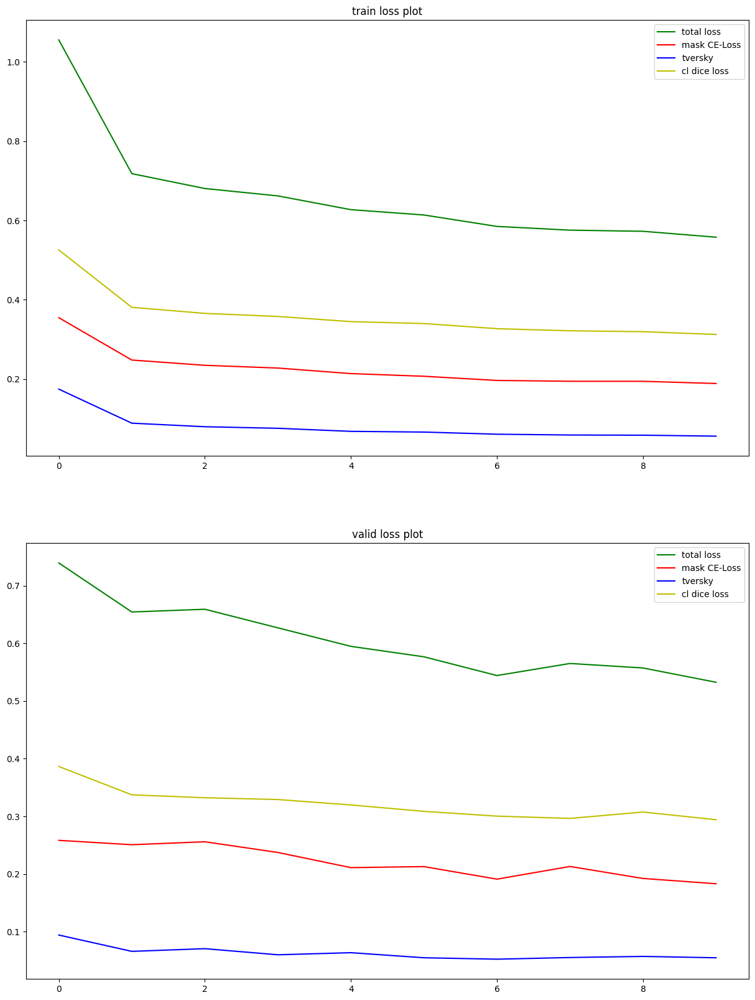

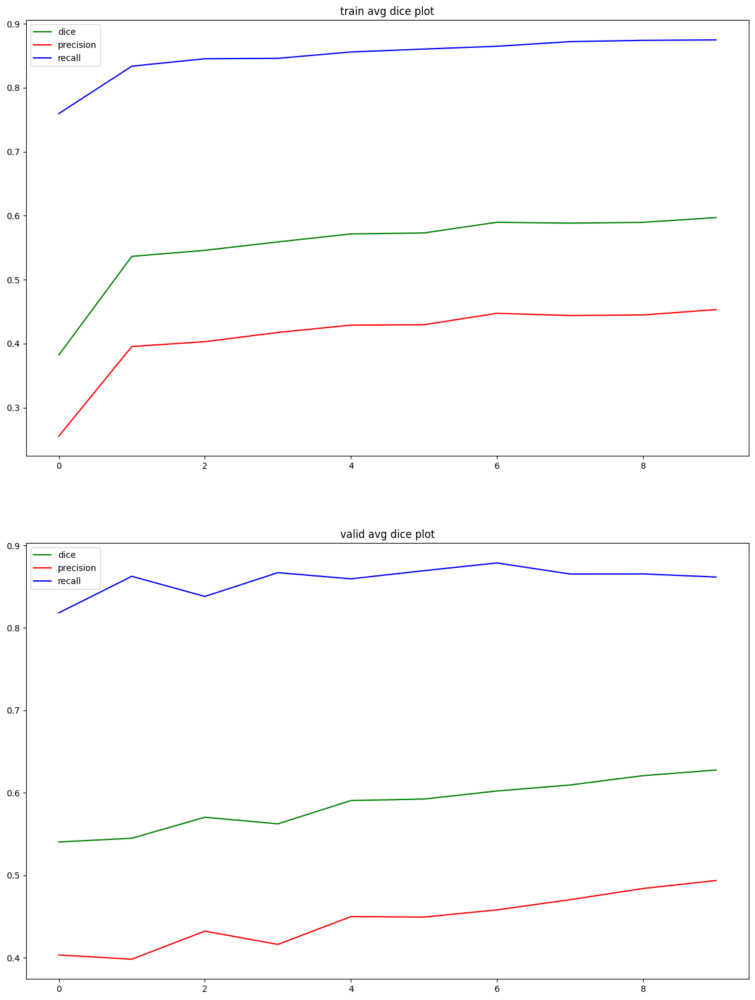

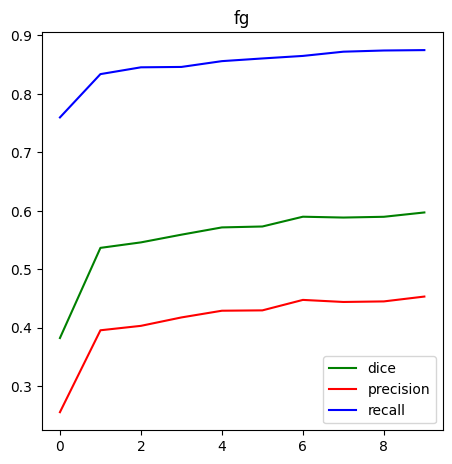

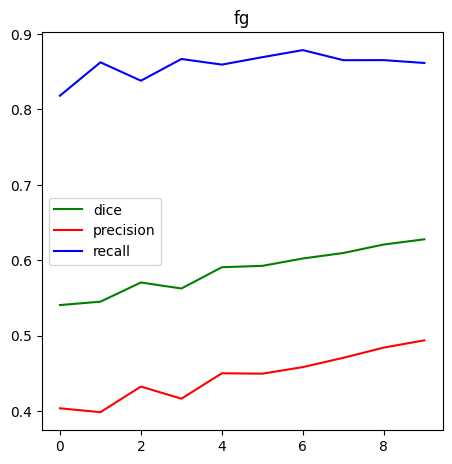

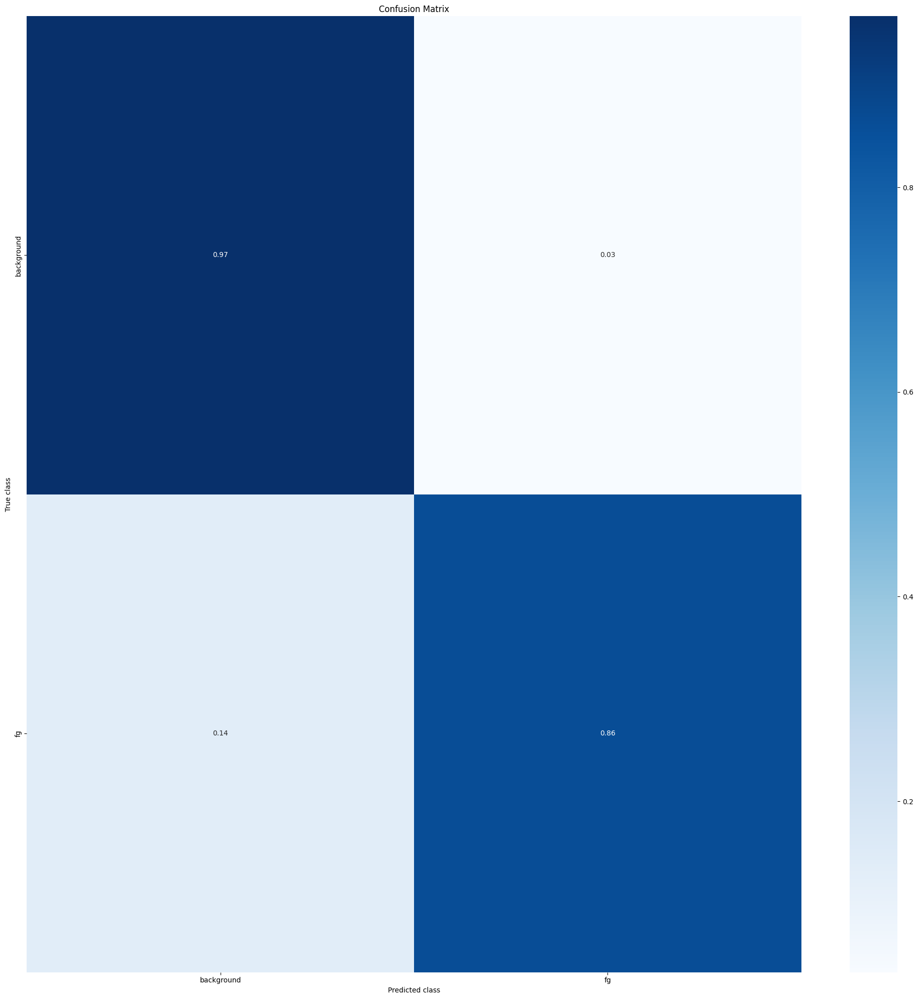

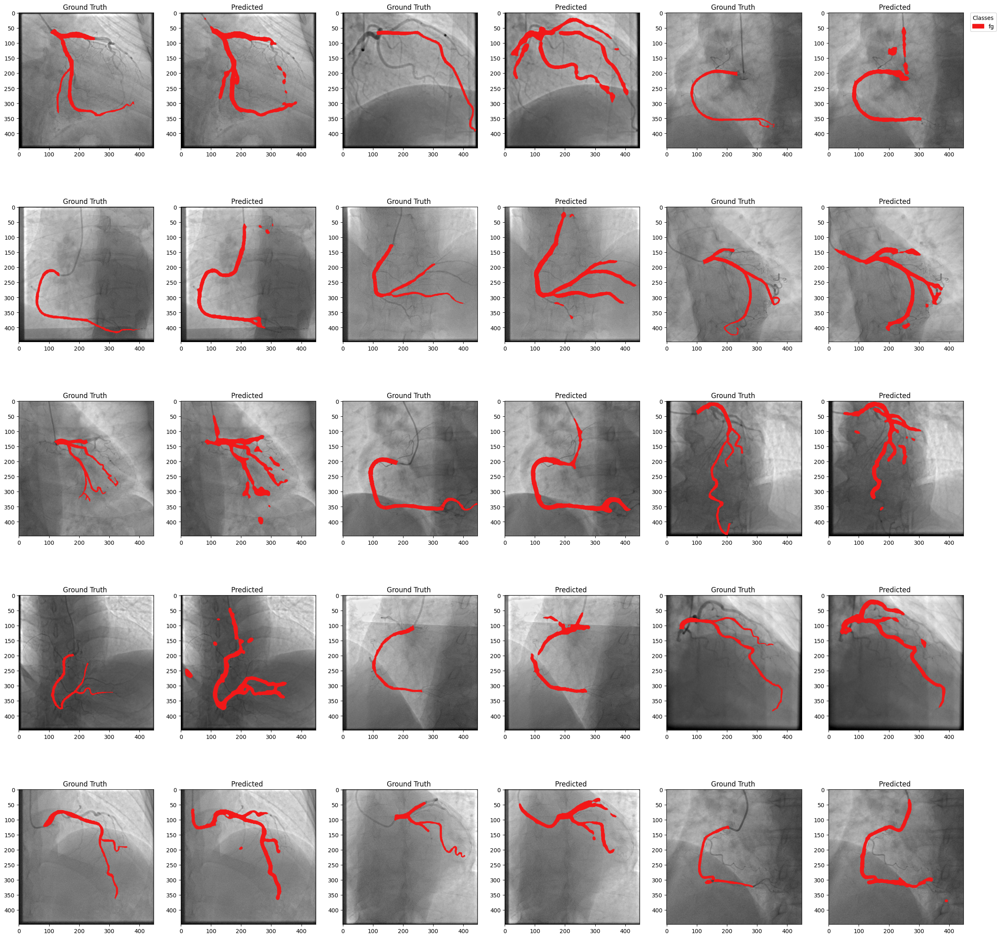

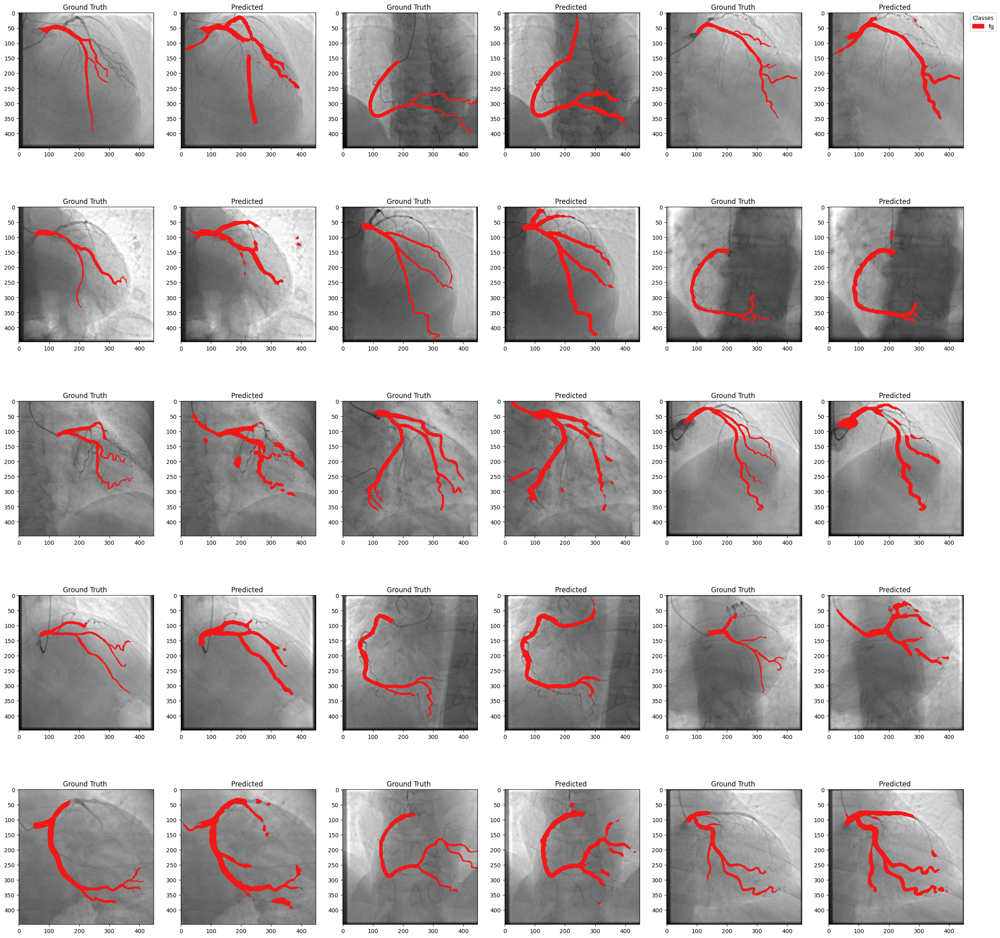

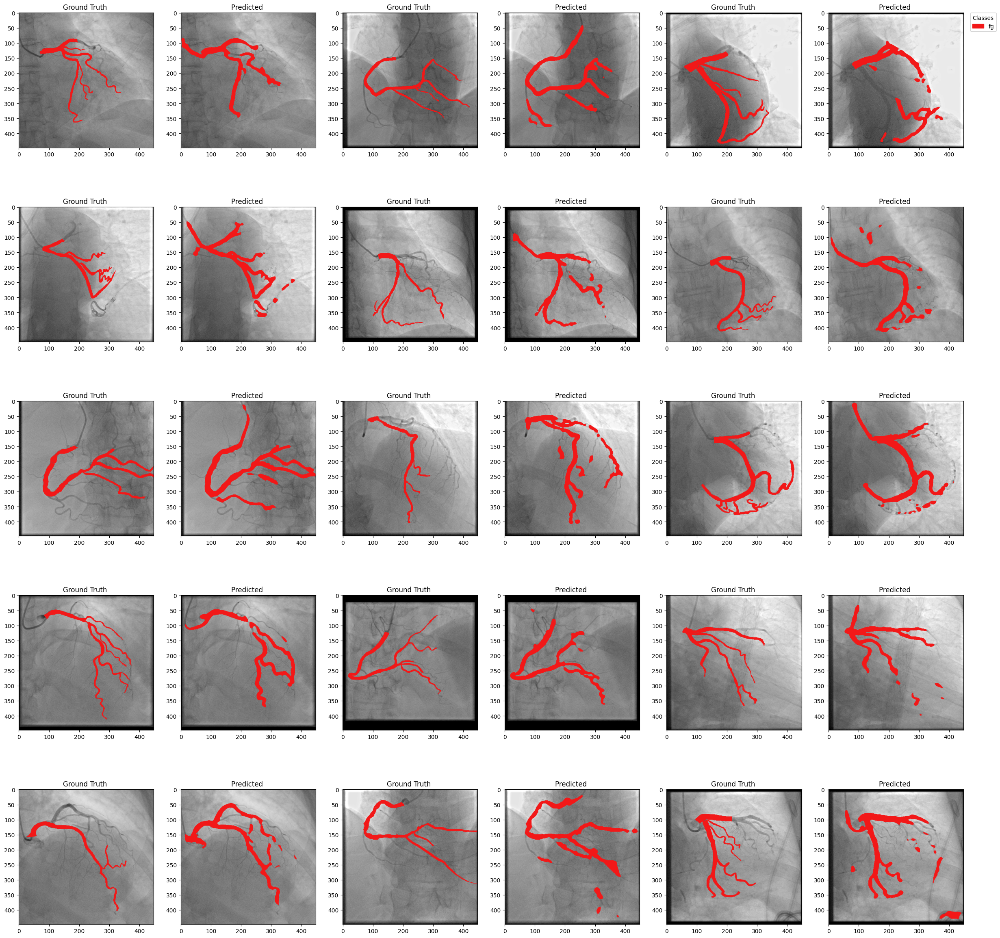

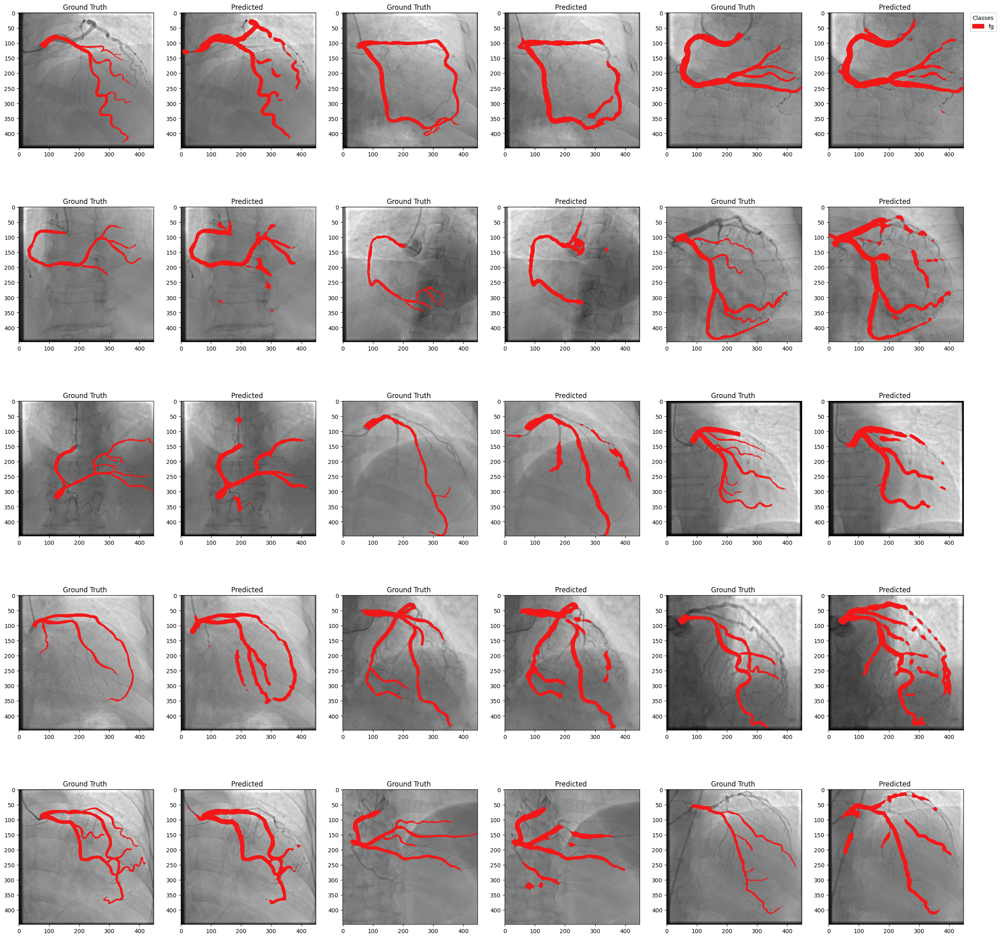

In [9]:
save_full_report(
    recorder= recorder , 
    output_base_path=args["output_base_path"],
    model=best_model,
    valid_loader=valid_loader,
    normalizer = normalizer,
    args=args,
    class_map=class_map,
    name=args["name"],
    valid_images = valid_images,
    test_transforms = test_transforms,
    notebook_name = "Multi_Main.ipynb",
    class_count = args["class_count"],
    device = args["device"],
    training_mode = args["training_mode"]
)